In [55]:
from collections import Counter
from enum import IntFlag
import re

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from wordcloud import WordCloud

In [13]:
salary_data = pd.read_json('https://data.cityofnewyork.us/resource/k397-673e.json?$limit=6000000')

In [37]:
%%time
salary_data.to_parquet('/mnt/i/data/2023-nyc-salaries.pq')

In [45]:
!ls -lh /mnt/i/data

total 204M
-rwxrwxrwx 1 nkrishna nkrishna 204M Mar 23 14:42 2023-nyc-salaries.pq


In [2]:
%%time
salary_data = pd.read_parquet('/mnt/i/data/2023-nyc-salaries.pq')

CPU times: user 3.06 s, sys: 1.54 s, total: 4.6 s
Wall time: 2.51 s


In [3]:
salary_data1 = salary_data[salary_data.fiscal_year == 2023]
salary_data1.describe()

,fiscal_year,payroll_number,base_salary,regular_hours,regular_gross_paid,ot_hours,total_ot_paid,total_other_pay
count,552938.0,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000
mean,2023.0,573.035691,51337.371450,650.797779,47342.361612,72.551699,4575.784169,4352.708365
std,0.0,307.570095,48070.639384,883.960010,44230.169847,187.328651,12978.876359,7801.349333
min,2023.0,2.000000,1.000000,-1529.270000,-82023.270000,-96.750000,-7096.640000,-205944.480000
25%,2023.0,300.000000,33.180000,0.000000,4913.157500,0.000000,0.000000,0.000000
50%,2023.0,742.000000,48755.000000,0.000000,39244.800000,0.000000,0.000000,662.790000
75%,2023.0,747.000000,92073.000000,1820.000000,84744.340000,1.000000,83.882500,5646.572500
max,2023.0,996.000000,363346.000000,6666.000000,409058.380000,3172.500000,245420.330000,479358.000000


In [6]:
salary_data1 = salary_data1.dropna(subset=['regular_gross_paid'])
salary_data1.regular_gross_paid = salary_data1.regular_gross_paid.astype(int)

In [4]:
salary_data1.describe()

,fiscal_year,payroll_number,base_salary,regular_hours,regular_gross_paid,ot_hours,total_ot_paid,total_other_pay
count,552938.0,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000
mean,2023.0,573.035691,51337.371450,650.797779,47342.361612,72.551699,4575.784169,4352.708365
std,0.0,307.570095,48070.639384,883.960010,44230.169847,187.328651,12978.876359,7801.349333
min,2023.0,2.000000,1.000000,-1529.270000,-82023.270000,-96.750000,-7096.640000,-205944.480000
25%,2023.0,300.000000,33.180000,0.000000,4913.157500,0.000000,0.000000,0.000000
50%,2023.0,742.000000,48755.000000,0.000000,39244.800000,0.000000,0.000000,662.790000
75%,2023.0,747.000000,92073.000000,1820.000000,84744.340000,1.000000,83.882500,5646.572500
max,2023.0,996.000000,363346.000000,6666.000000,409058.380000,3172.500000,245420.330000,479358.000000


In [5]:
salary_data1.columns

Index(['fiscal_year', 'payroll_number', 'agency_name', 'last_name',
       'first_name', 'mid_init', 'agency_start_date', 'work_location_borough',
       'title_description', 'leave_status_as_of_june_30', 'base_salary',
       'pay_basis', 'regular_hours', 'regular_gross_paid', 'ot_hours',
       'total_ot_paid', 'total_other_pay'],
      dtype='object')

In [6]:
title_salary = salary_data1.sort_values('regular_gross_paid')

In [73]:
class NGrams(IntFlag):
    NONE = 0
    UNI = 1
    BI = 2

def make_wordclouds(title_salary, num_bins = 10, start_quantile = 0, *,
                    add_ngrams: NGrams = NGrams.NONE,
                    stop_list={}):
    bin_size = int(len(title_salary) / num_bins)
    boundaries = [None] + list(range(1 * bin_size, num_bins * bin_size, bin_size)) + [None]
    quantiles = []
    for lo, hi in zip(boundaries[:-1], boundaries[1:]):
        quantiles.append(title_salary[lo:hi])


    for idx, quantile in enumerate(quantiles[start_quantile:]):
        wc = WordCloud(width=800, height=400, collocations=False)
    
        counts = Counter()
        total_tokens = 0
        for title in quantile.title_description:
            if not title:
                continue
            title = re.sub(r'- *', ' ', title)
            counts[title] += 1
            total_tokens += 1
            if add_ngrams != NGrams.NONE:
                # Tokenize the title
                words = [word for word in title.split() if word and word.lower() not in stop_list]
                if add_ngrams & NGrams.UNI and len(words) > 1:
                    for word in words:
                        counts[word] += 1
                        total_tokens += 1
                if add_ngrams & NGrams.BI and len(words) > 2:
                    for pair in zip(words[:-1], words[1:]):
                        counts[' '.join(pair)] += 1
                        total_tokens += 1
                    
        wc.generate_from_frequencies({item: count / total_tokens for item, count in counts.items()})
        # Note that the ranges use the unshuffled data
        print(f'Quantile {start_quantile + idx+1}: {quantile.regular_gross_paid.iloc[0]} - '
              f'{quantile.regular_gross_paid.iloc[-1]}, '
              f'{len(quantile)} salaries')
        display(wc.to_image())

# Full titles

## Deciles

Quantile 1: -82023.27 - 547.0, 55293 salaries


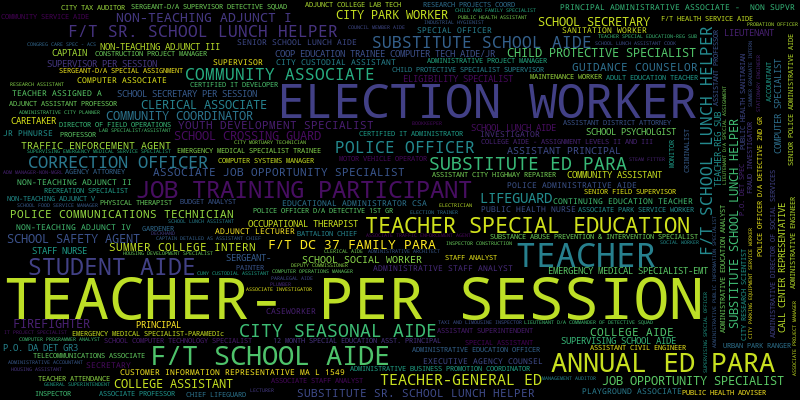

Quantile 2: 547.0 - 2528.08, 55293 salaries


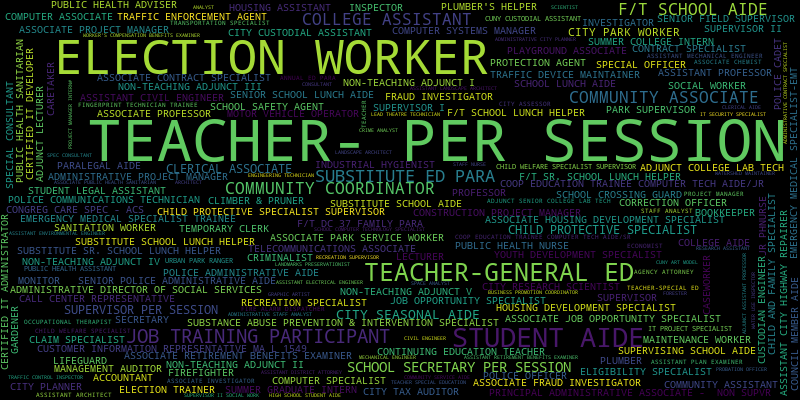

Quantile 3: 2528.1 - 8267.93, 55293 salaries


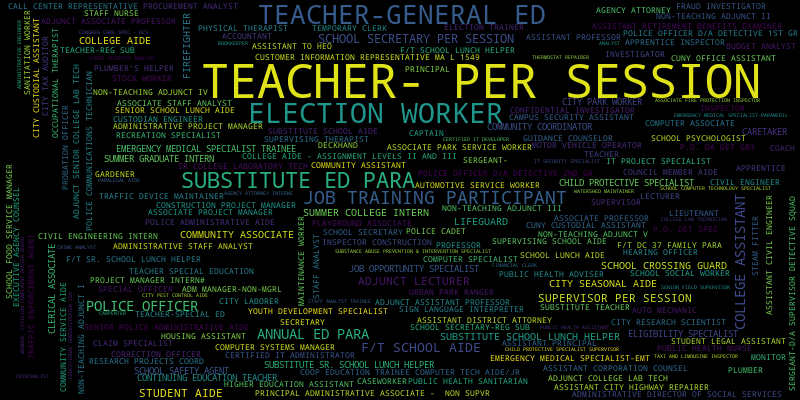

Quantile 4: 8267.93 - 20432.43, 55293 salaries


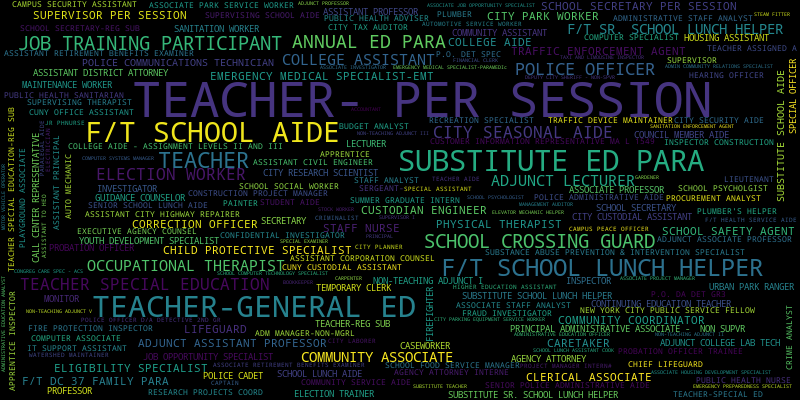

Quantile 5: 20432.9 - 39242.29, 55293 salaries


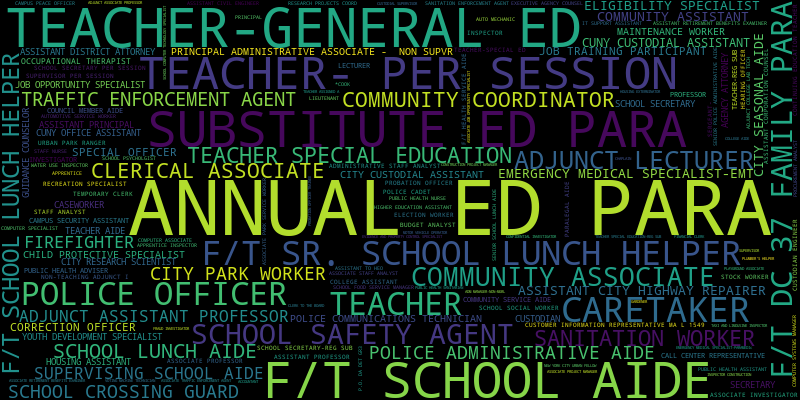

Quantile 6: 39243.2 - 52545.64, 55293 salaries


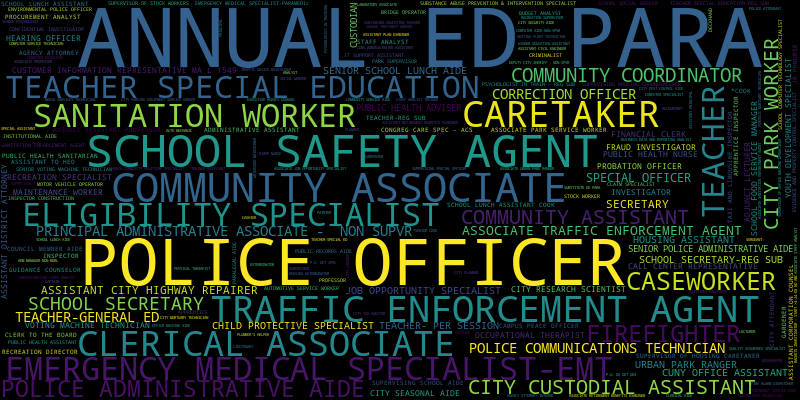

Quantile 7: 52545.95 - 74253.89, 55293 salaries


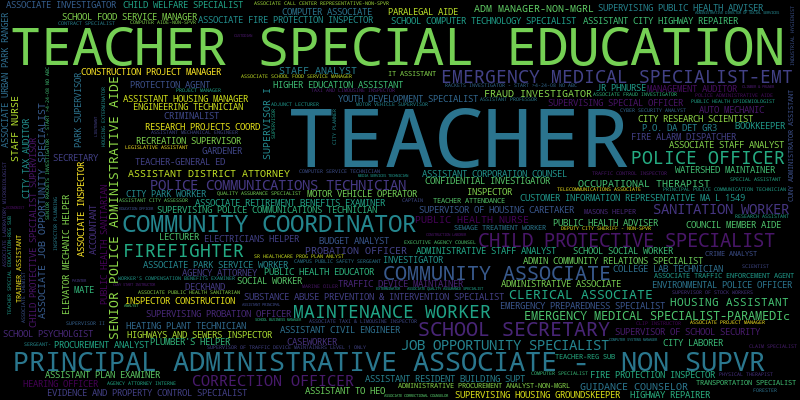

Quantile 8: 74253.89 - 91444.86, 55293 salaries


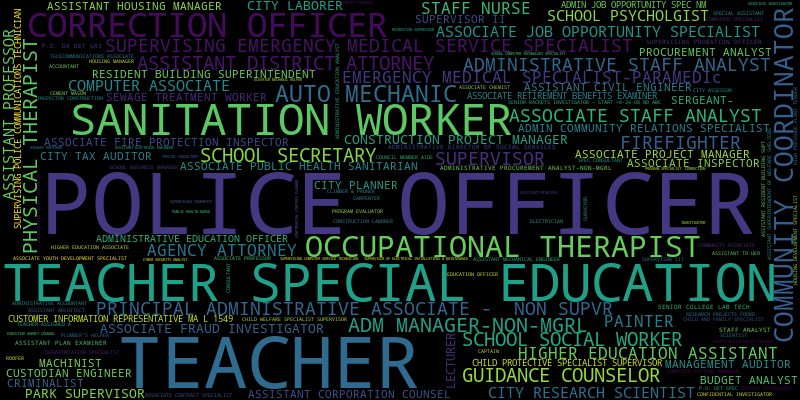

Quantile 9: 91444.86 - 109852.08, 55293 salaries


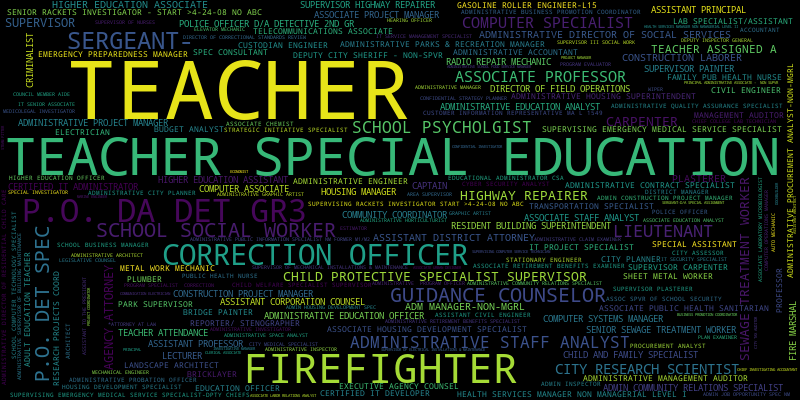

Quantile 10: 109852.08 - 409058.38, 55301 salaries


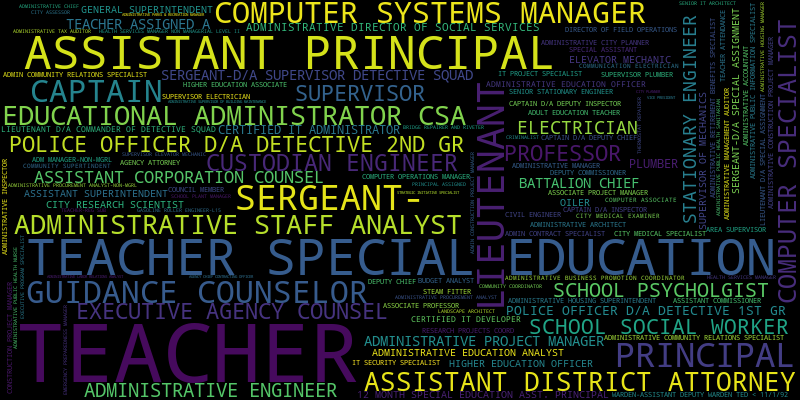

In [18]:
make_wordclouds(title_salary)

## Top Decile By Percentile

Quantile 91: 109852.08 - 111349.92, 5529 salaries


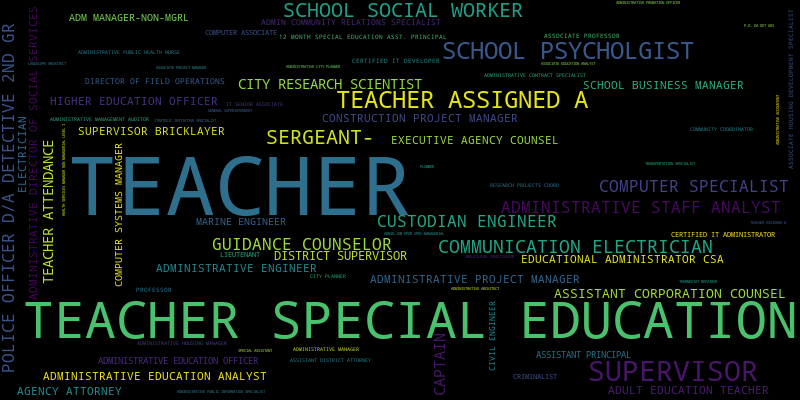

Quantile 92: 111349.92 - 115764.0, 5529 salaries


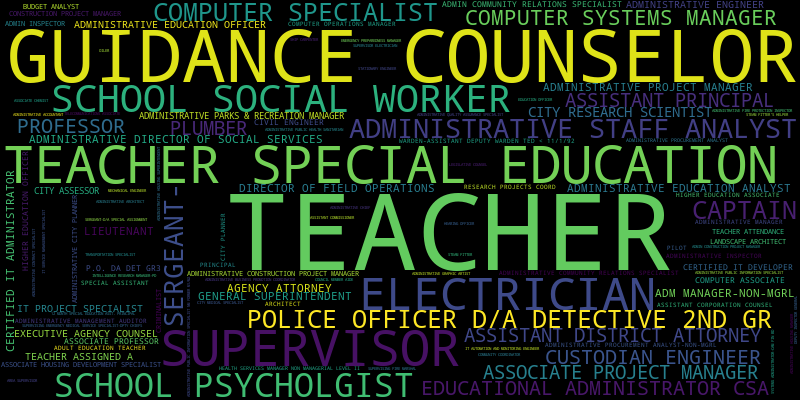

Quantile 93: 115764.0 - 118509.66, 5529 salaries


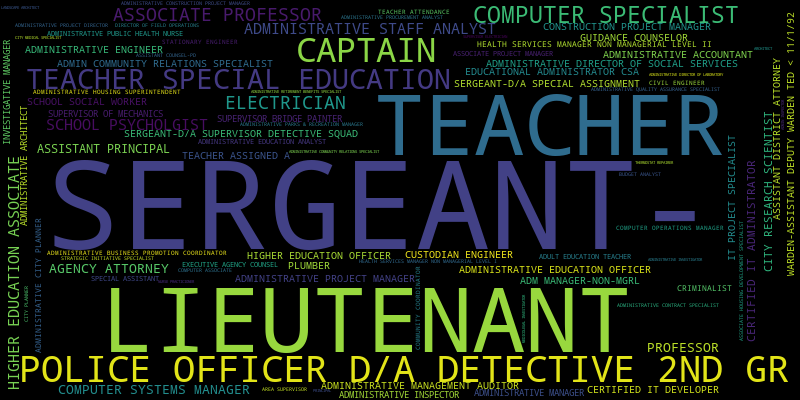

Quantile 94: 118509.86 - 121611.16, 5529 salaries


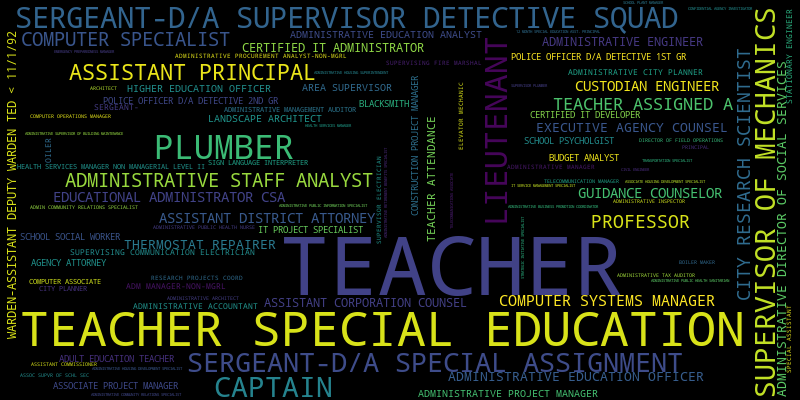

Quantile 95: 121611.84 - 125756.85, 5529 salaries


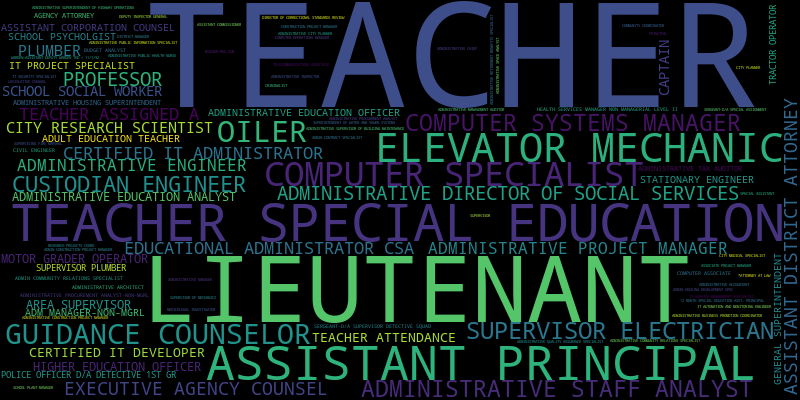

Quantile 96: 125759.67 - 128657.04, 5529 salaries


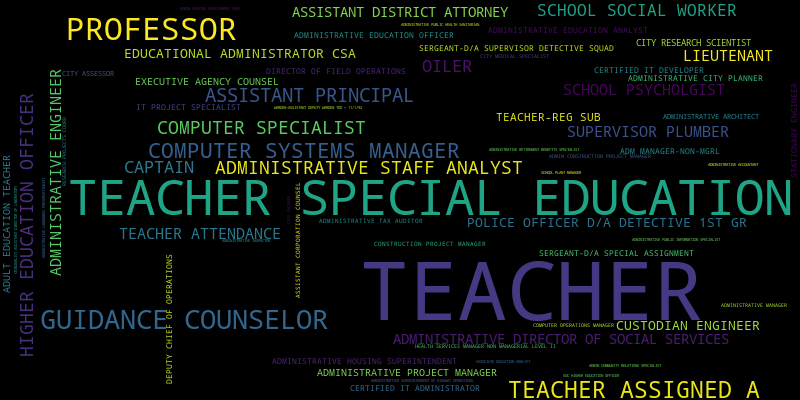

Quantile 97: 128657.04 - 132288.0, 5529 salaries


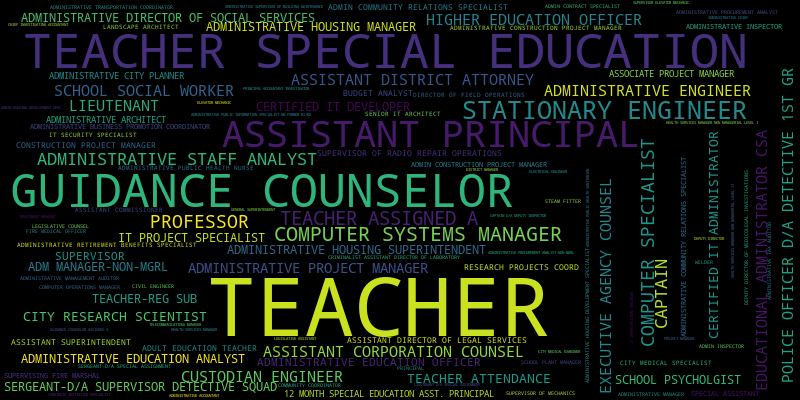

Quantile 98: 132288.0 - 140532.0, 5529 salaries


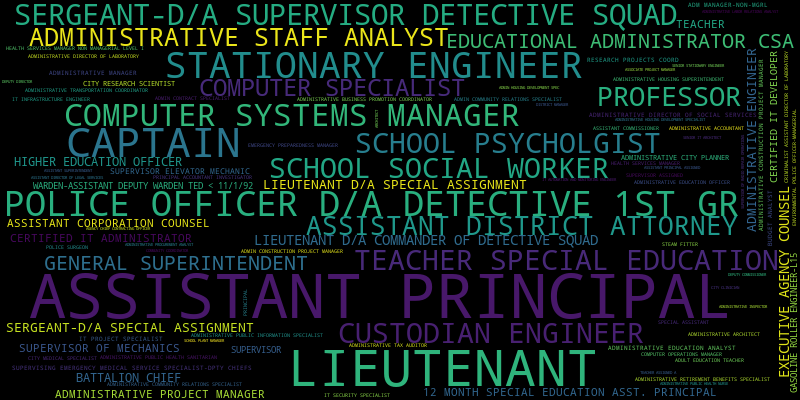

Quantile 99: 140532.0 - 160962.0, 5529 salaries


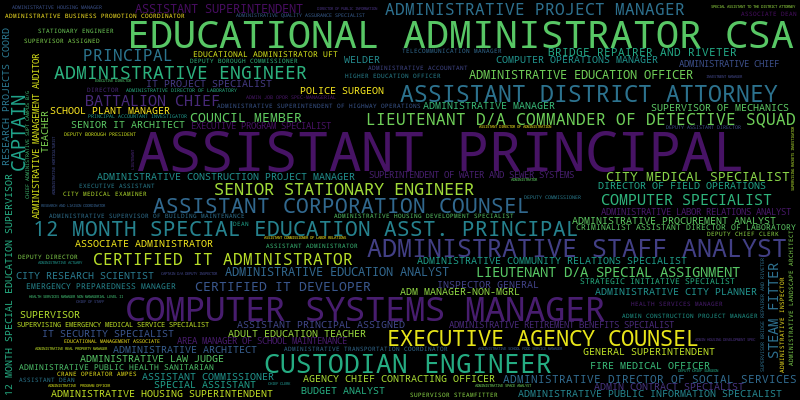

Quantile 100: 160962.0 - 409058.38, 5567 salaries


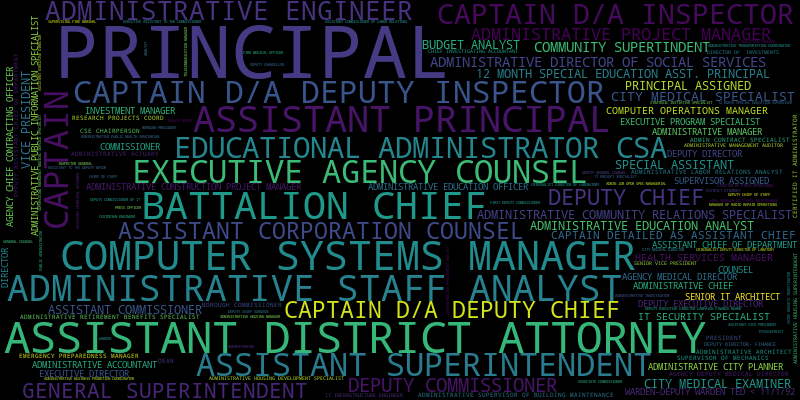

In [19]:
make_wordclouds(title_salary, 100, 90)

## The 1%

Quantile 991: 155512.31 - 158839.46, 552 salaries


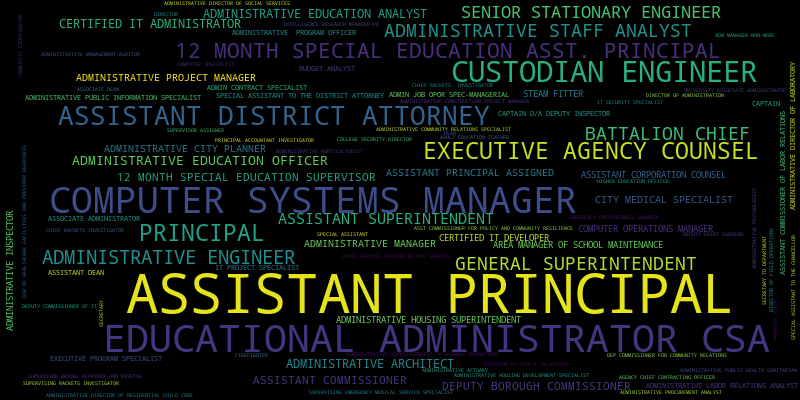

Quantile 992: 158852.04 - 162839.04, 552 salaries


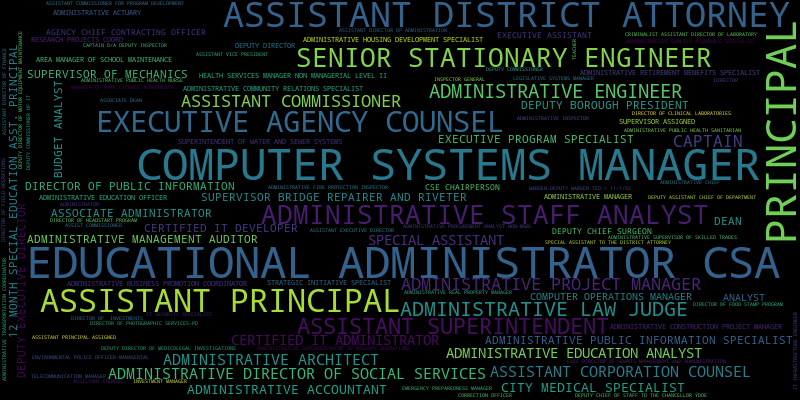

Quantile 993: 162849.36 - 166786.7, 552 salaries


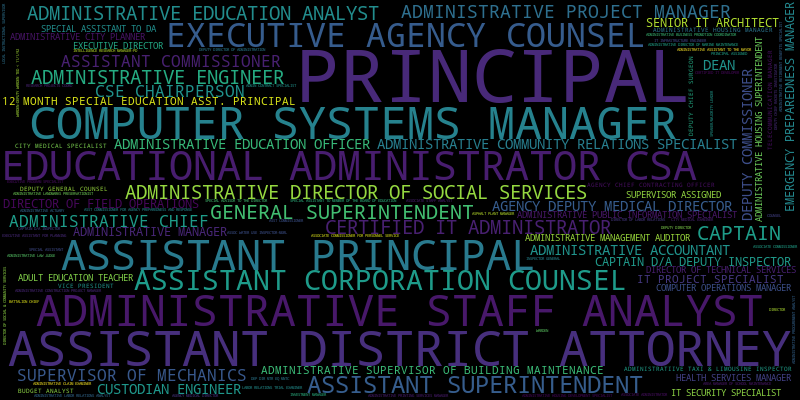

Quantile 994: 166803.77 - 169834.77, 552 salaries


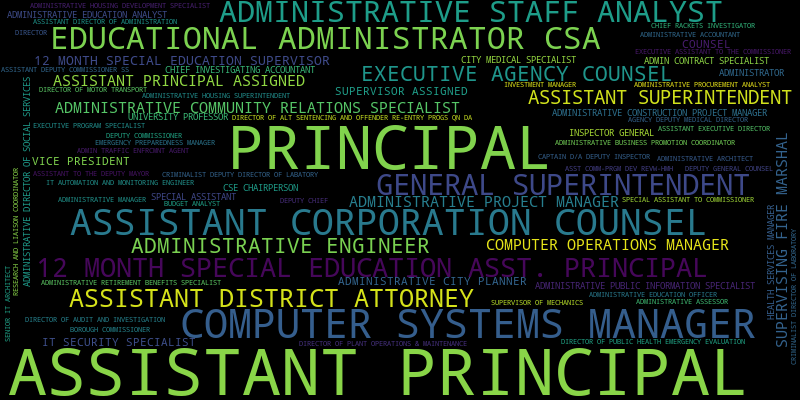

Quantile 995: 169834.77 - 174520.57, 552 salaries


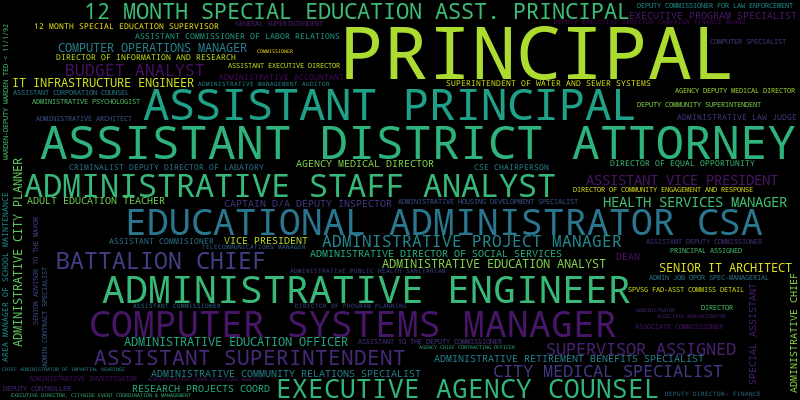

Quantile 996: 174520.57 - 176218.08, 552 salaries


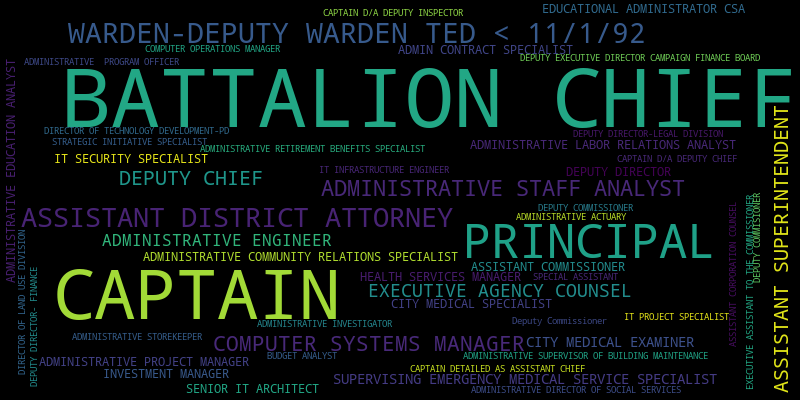

Quantile 997: 176218.08 - 181650.47, 552 salaries


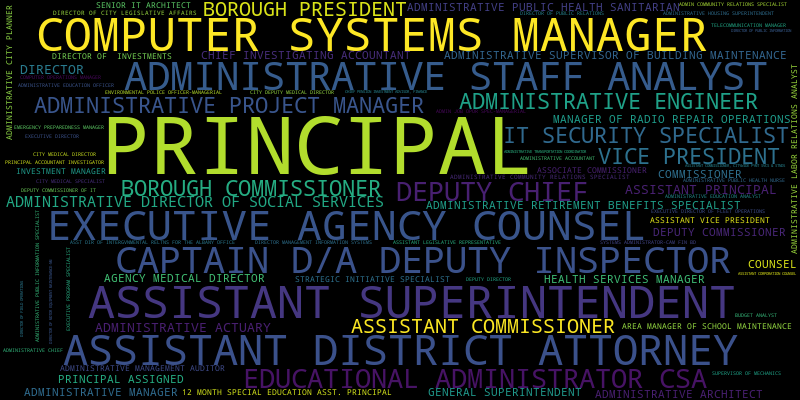

Quantile 998: 181660.96 - 185886.0, 552 salaries


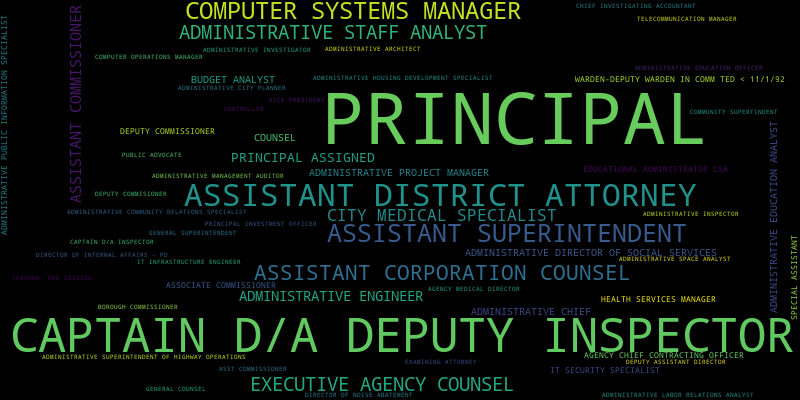

Quantile 999: 185886.0 - 191371.92, 552 salaries


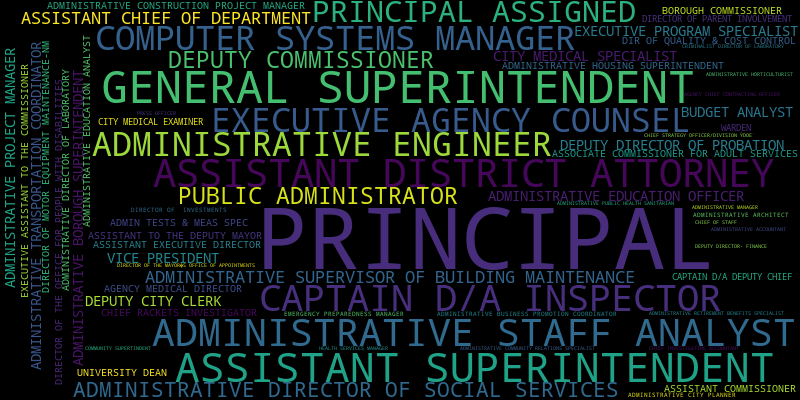

Quantile 1000: 191371.92 - 409058.38, 1490 salaries


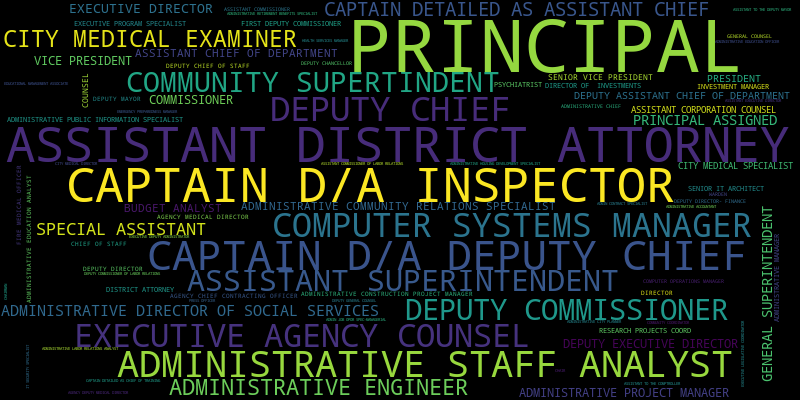

In [20]:
make_wordclouds(title_salary, 1000, 990)

# Adding n-grams of tokenized titles

## Deciles

Quantile 1: -82023.27 - 547.0, 55293 salaries


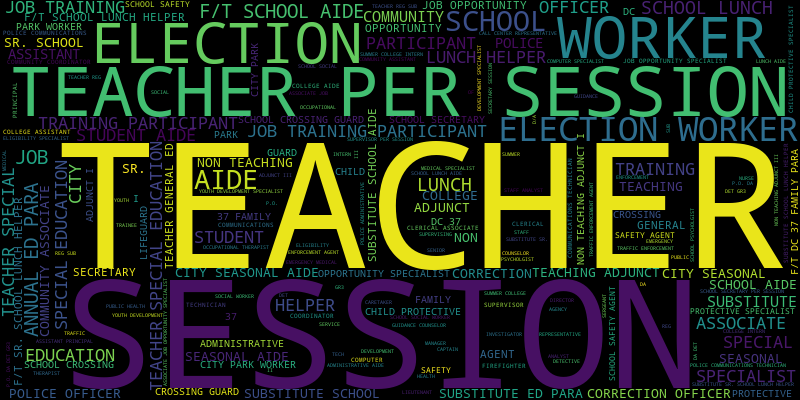

Quantile 2: 547.0 - 2528.08, 55293 salaries


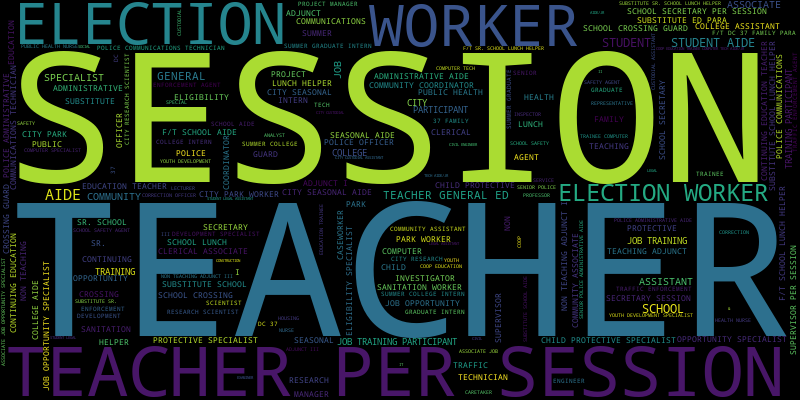

Quantile 3: 2528.1 - 8267.93, 55293 salaries


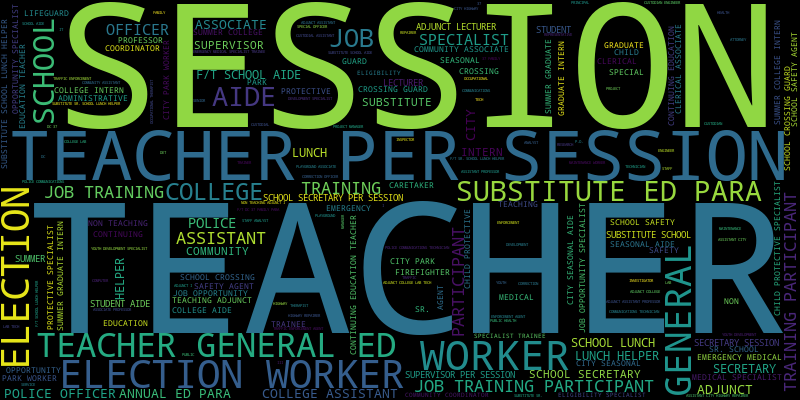

Quantile 4: 8267.93 - 20432.43, 55293 salaries


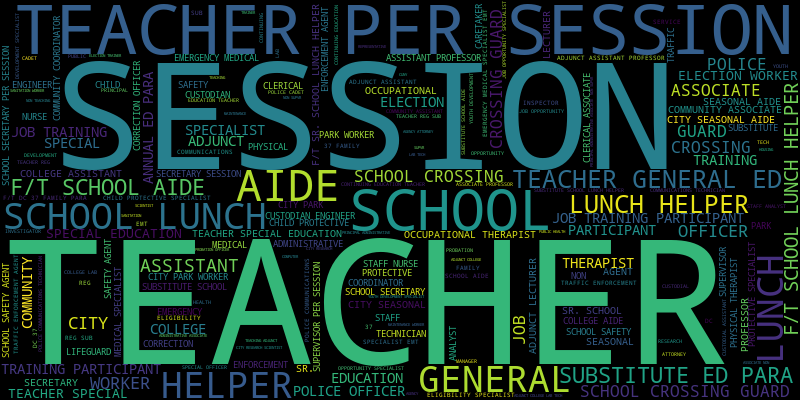

Quantile 5: 20432.9 - 39242.29, 55293 salaries


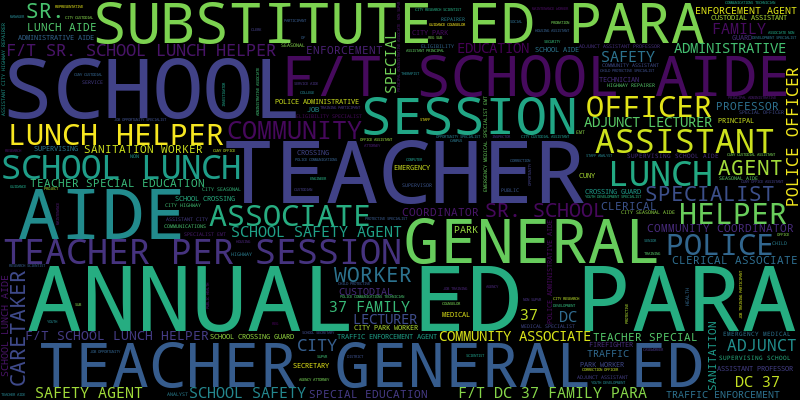

Quantile 6: 39243.2 - 52545.64, 55293 salaries


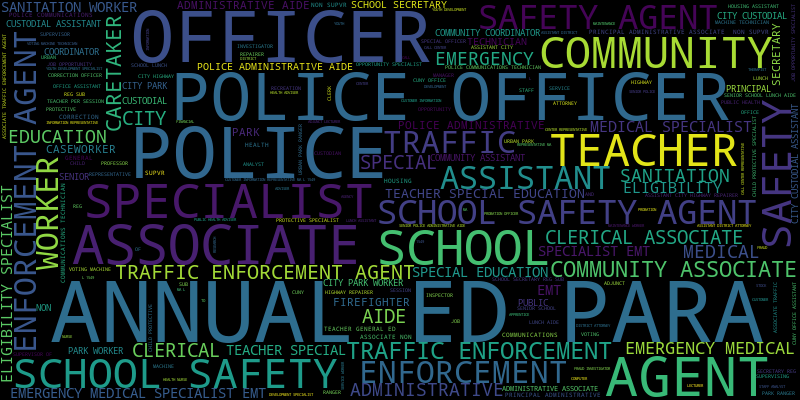

Quantile 7: 52545.95 - 74253.89, 55293 salaries


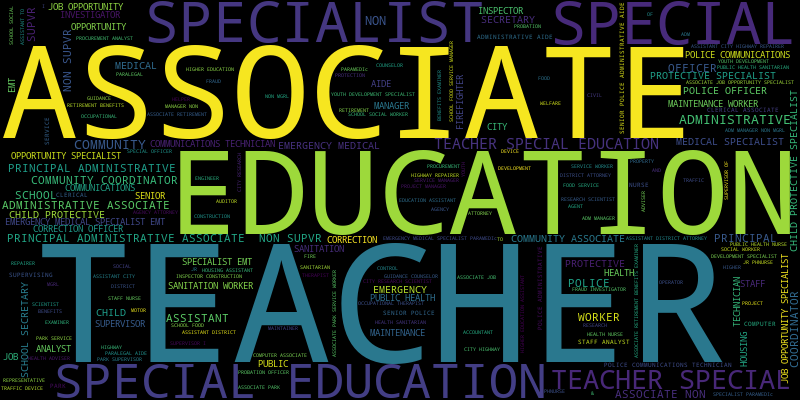

Quantile 8: 74253.89 - 91444.86, 55293 salaries


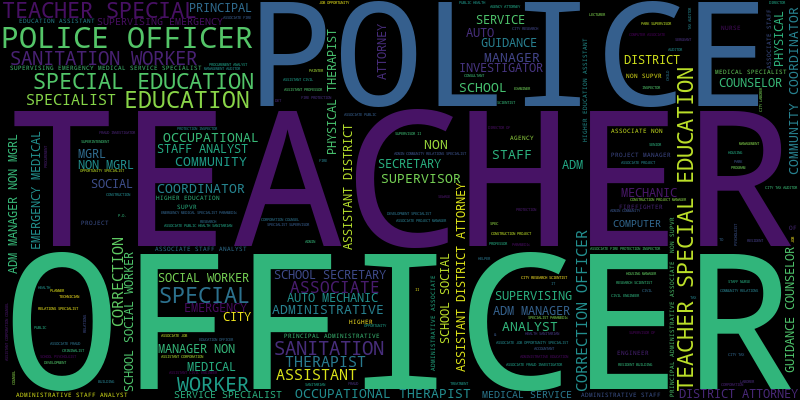

Quantile 9: 91444.86 - 109852.08, 55293 salaries


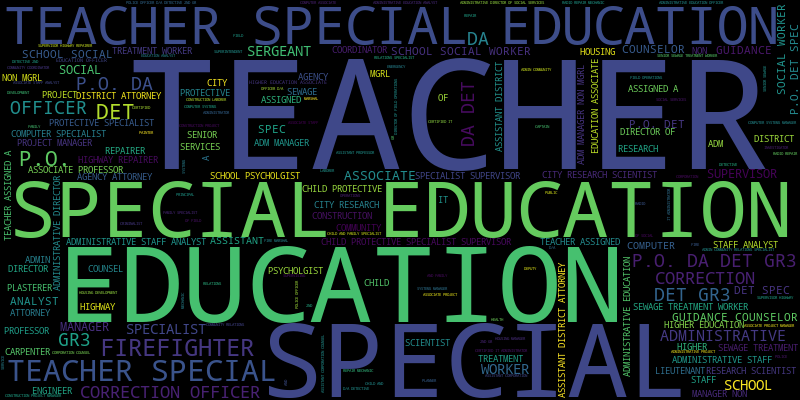

Quantile 10: 109852.08 - 409058.38, 55301 salaries


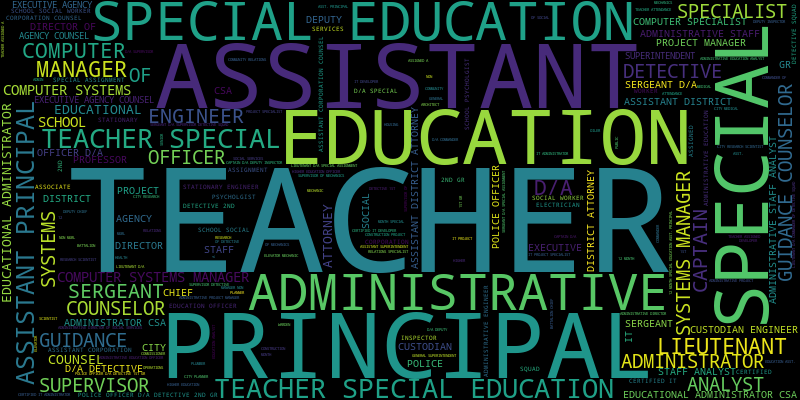

In [76]:
make_wordclouds(title_salary, add_ngrams=NGrams.UNI | NGrams.BI, stop_list={'per', 'para', 'ed', 'f/t'})

## Top Decile By Percentile

Quantile 91: 109852.08 - 111349.92, 5529 salaries


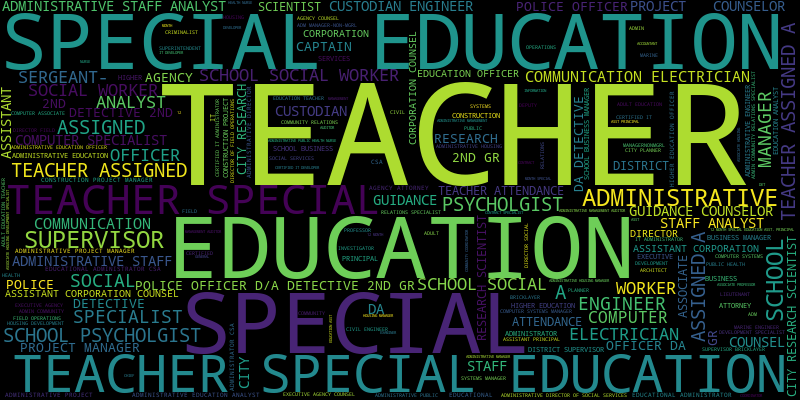

Quantile 92: 111349.92 - 115764.0, 5529 salaries


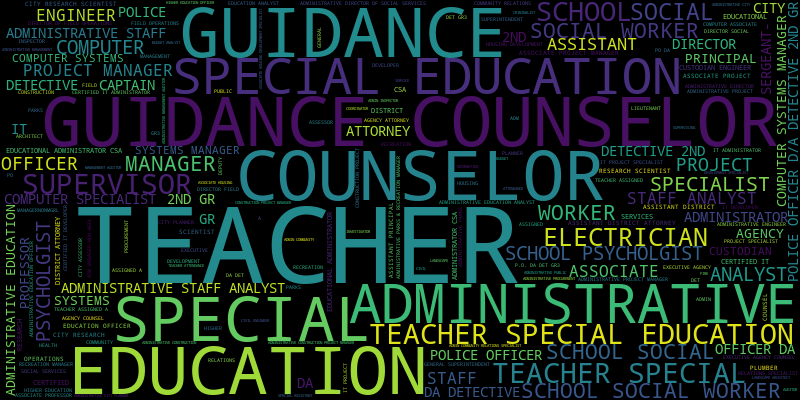

Quantile 93: 115764.0 - 118509.66, 5529 salaries


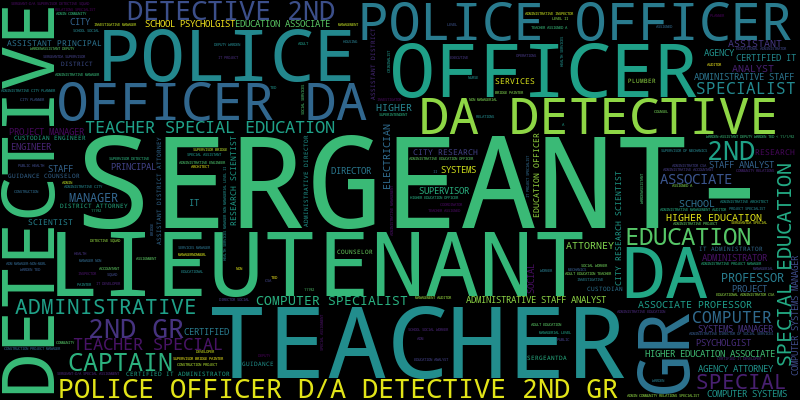

Quantile 94: 118509.86 - 121611.16, 5529 salaries


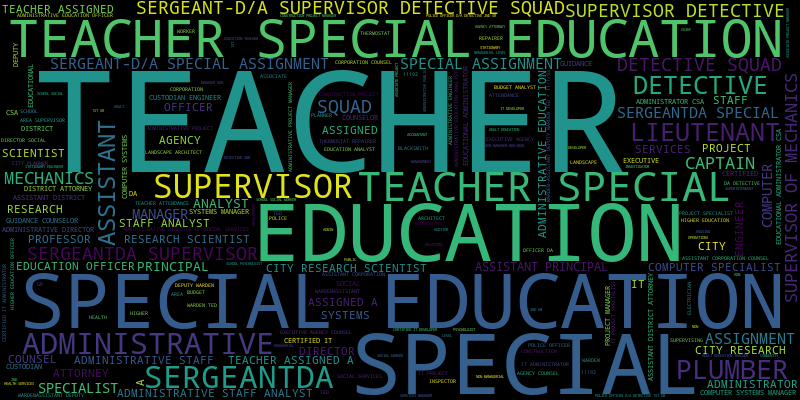

Quantile 95: 121611.84 - 125756.85, 5529 salaries


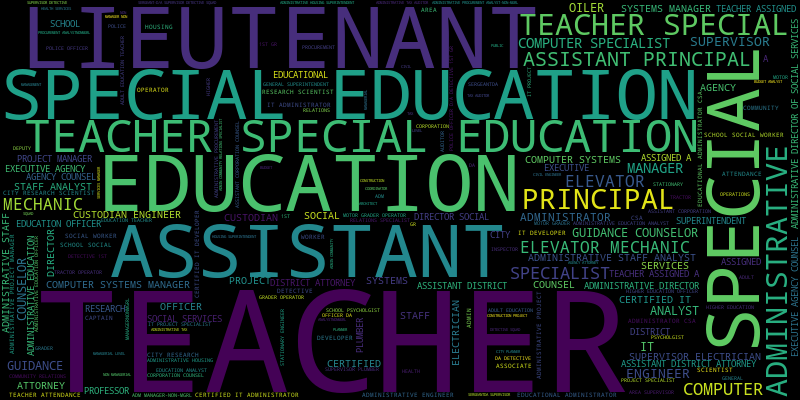

Quantile 96: 125759.67 - 128657.04, 5529 salaries


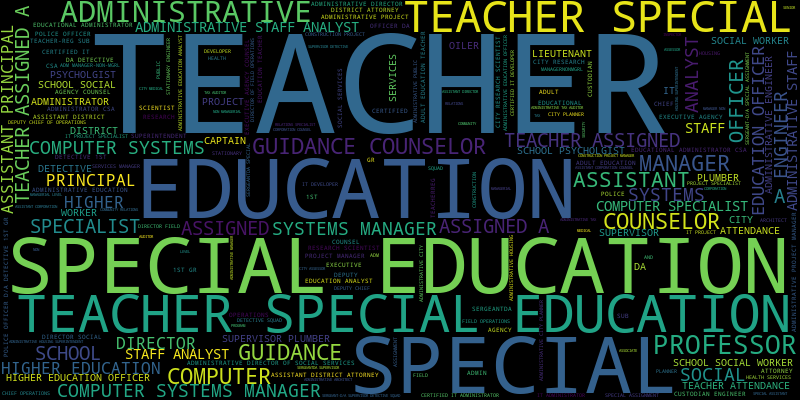

Quantile 97: 128657.04 - 132288.0, 5529 salaries


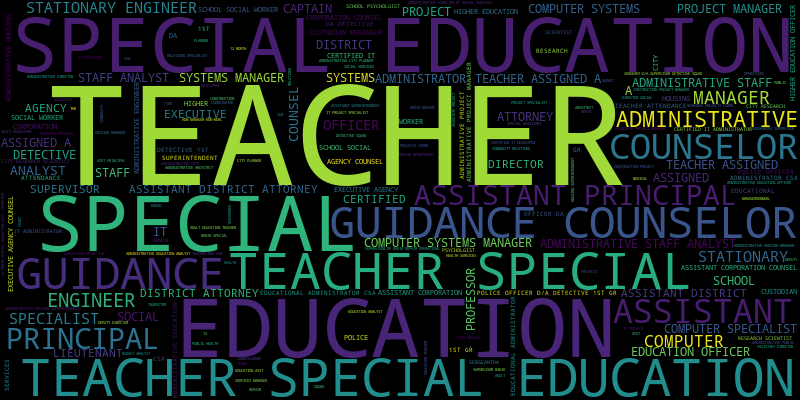

Quantile 98: 132288.0 - 140532.0, 5529 salaries


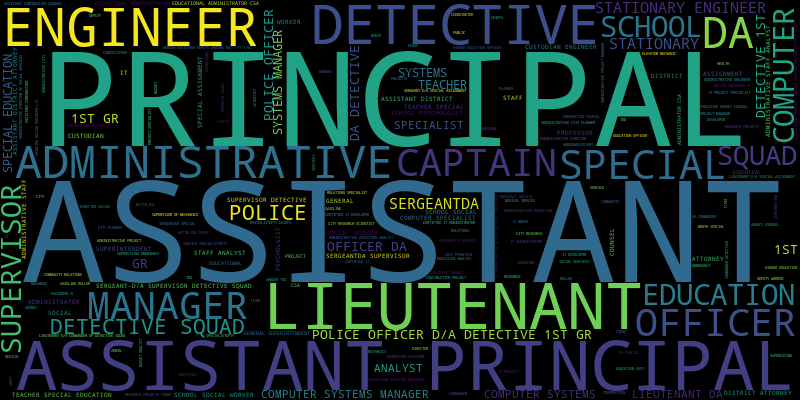

Quantile 99: 140532.0 - 160962.0, 5529 salaries


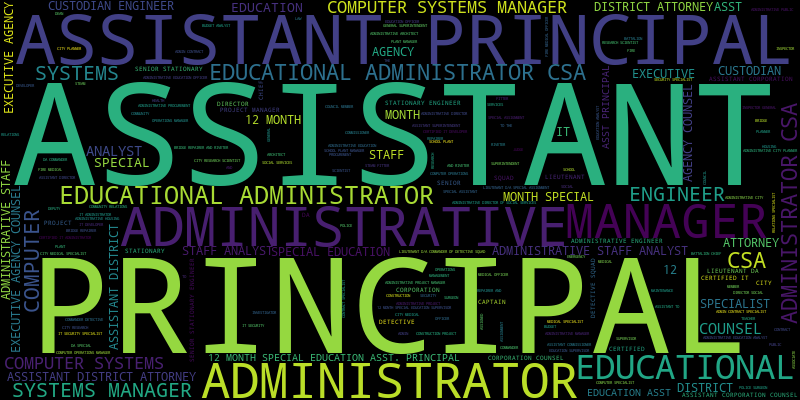

Quantile 100: 160962.0 - 409058.38, 5567 salaries


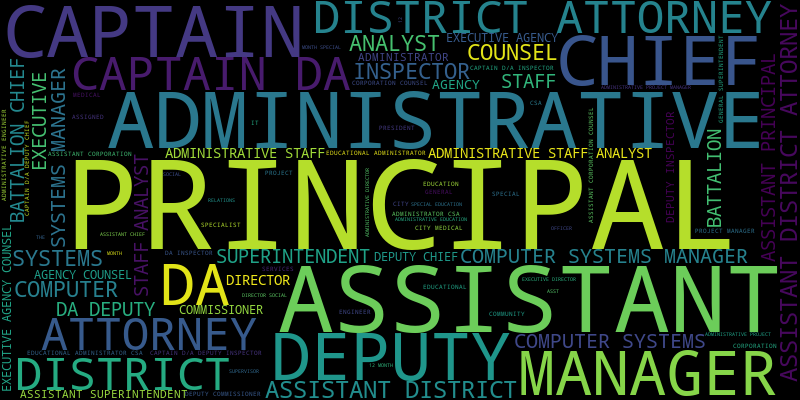

In [63]:
make_wordclouds(title_salary, 100, 90, add_ngrams=NGrams.UNI | NGrams.BI, stop_list={'of'})

## The 1%

Quantile 991: 155512.31 - 158839.46, 552 salaries


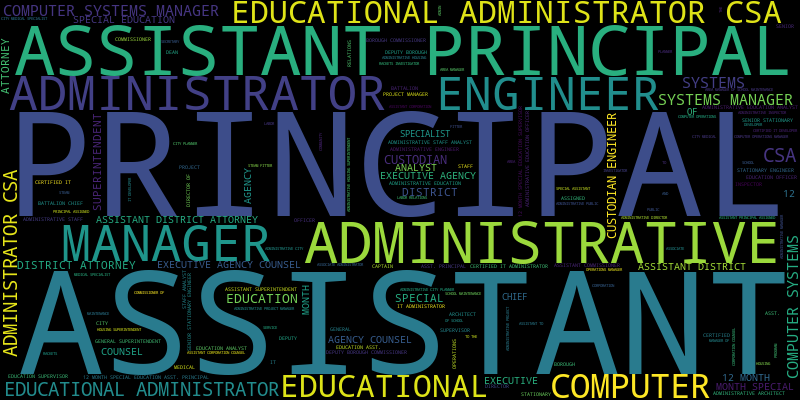

Quantile 992: 158852.04 - 162839.04, 552 salaries


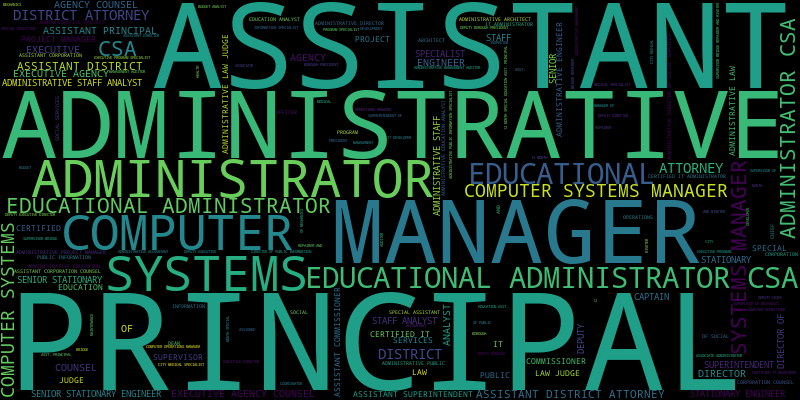

Quantile 993: 162849.36 - 166786.7, 552 salaries


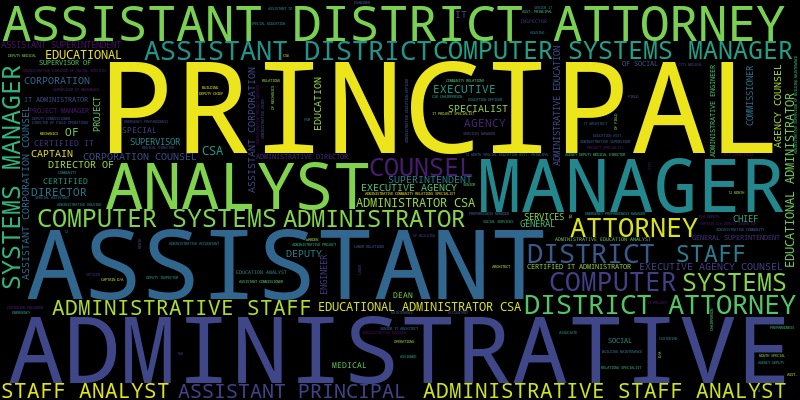

Quantile 994: 166803.77 - 169834.77, 552 salaries


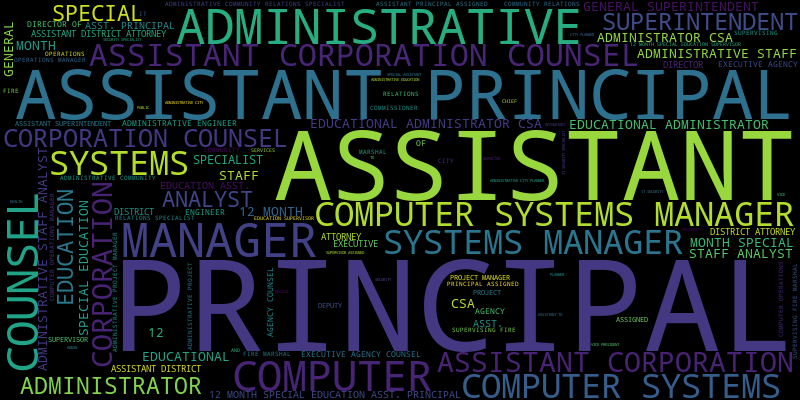

Quantile 995: 169834.77 - 174520.57, 552 salaries


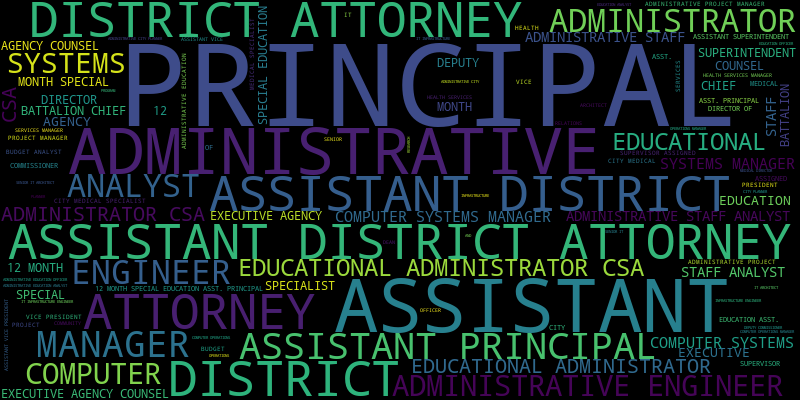

Quantile 996: 174520.57 - 176218.08, 552 salaries


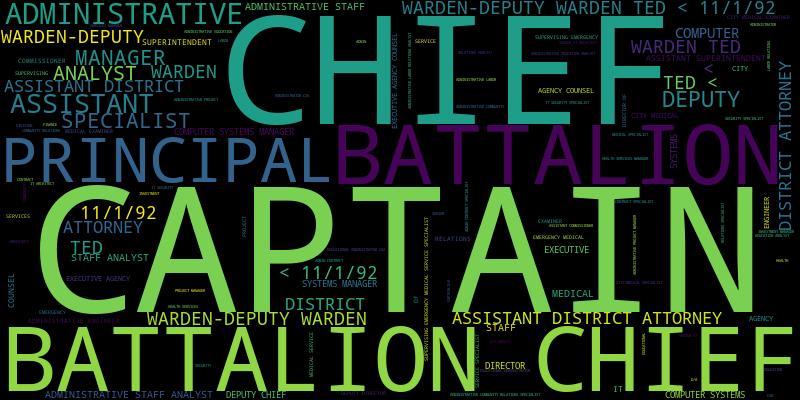

Quantile 997: 176218.08 - 181650.47, 552 salaries


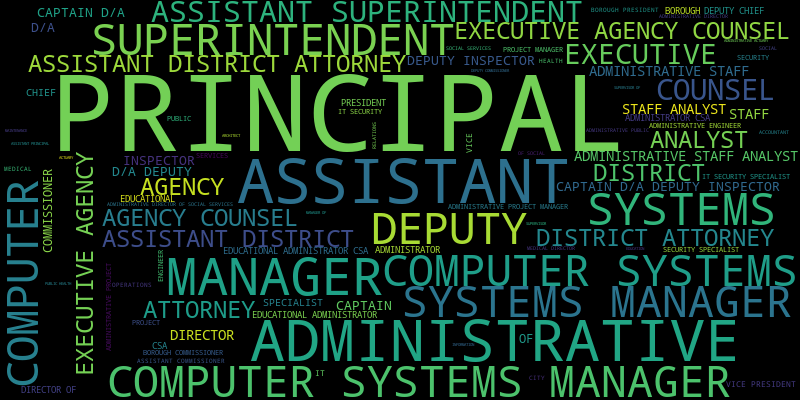

Quantile 998: 181660.96 - 185886.0, 552 salaries


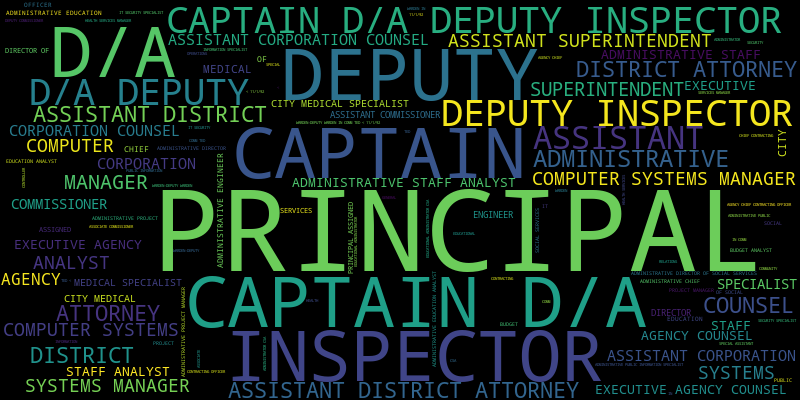

Quantile 999: 185886.0 - 191371.92, 552 salaries


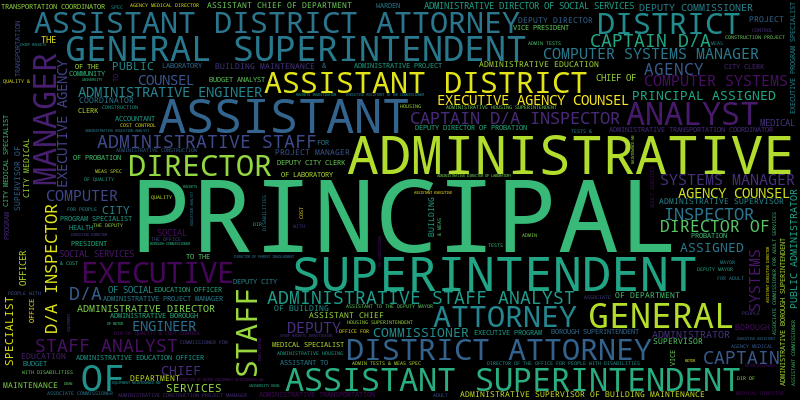

Quantile 1000: 191371.92 - 409058.38, 1490 salaries


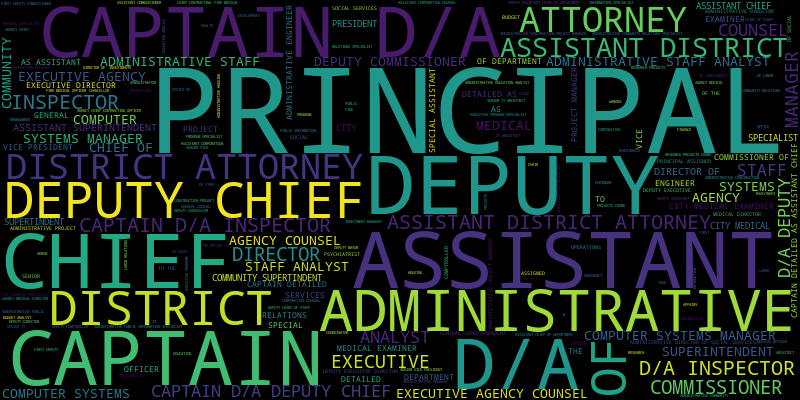

In [45]:
make_wordclouds(title_salary, 1000, 990, add_ngrams=NGramType.UNI_AND_BIGRAMS)